<a href="https://colab.research.google.com/github/melih84/Art-generator-from-song-lyrics/blob/main/Lyrics_to_art.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Lyrics to art using CC12M Art generation model



## 1) Download LyricsGenius for getting the lyrics

Goal of this project is to build a program which takes lyrics of a song as an input and returns an image the AI resonates with song lyrics using NLP and GAN.

In [ ]:
import nltk
nltk.download("popular")
nltk.download('brown')

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/cmudict.zip.
[nltk_data]    | Downloading package gazetteers to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gazetteers.zip.
[nltk_data]    | Downloading package genesis to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/genesis.zip.
[nltk_data]    | Downloading package gutenberg to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/gutenberg.zip.
[nltk_data]    | Downloading package inaugural to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/inaugural.zip.
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/movie_reviews.zip.
[nltk_data]    | Downloading package names to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/names.zip.
[nltk_data]    | Downloading package shakespeare to /root/nltk_data...
[nlt

True

In [ ]:
!pip install lyricsgenius

     |████████████████████████████████| 59 kB 3.3 MB/s 


## 2) Download the requirements for the Art generator

Copyright information of the generator

In [ ]:
# @title Licensed under the MIT License

# Copyright (c) 2022 Katherine Crowson

# Permission is hereby granted, free of charge, to any person obtaining a copy
# of this software and associated documentation files (the "Software"), to deal
# in the Software without restriction, including without limitation the rights
# to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
# copies of the Software, and to permit persons to whom the Software is
# furnished to do so, subject to the following conditions:

# The above copyright notice and this permission notice shall be included in
# all copies or substantial portions of the Software.

# THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
# IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
# FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
# AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
# LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
# OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN
# THE SOFTWARE.

In [ ]:
#try:
 #   !rm -rf v-diffusion-pytorch
#except:
 #   print("There is nothing wrong")

In [ ]:
!pip install ftfy regex requests tqdm
!git clone --recursive https://github.com/crowsonkb/v-diffusion-pytorch

     |████████████████████████████████| 53 kB 1.3 MB/s 
Cloning into 'v-diffusion-pytorch'...
remote: Enumerating objects: 138, done.
remote: Counting objects: 100% (83/83), done.
remote: Compressing objects: 100% (34/34), done.
remote: Total 138 (delta 72), reused 49 (delta 49), pack-reused 55
Receiving objects: 100% (138/138), 29.88 KiB | 7.47 MiB/s, done.
Resolving deltas: 100% (88/88), done.
Submodule 'CLIP' (https://github.com/openai/CLIP) registered for path 'CLIP'
Cloning into '/content/v-diffusion-pytorch/CLIP'...
remote: Enumerating objects: 222, done.        
remote: Total 222 (delta 0), reused 0 (delta 0), pack-reused 222        
Receiving objects: 100% (222/222), 8.92 MiB | 14.61 MiB/s, done.
Resolving deltas: 100% (111/111), done.
Submodule path 'CLIP': checked out '40f5484c1c74edd83cb9cf687c6ab92b28d8b656'


In [ ]:
!mkdir v-diffusion-pytorch/checkpoints
!wget https://the-eye.eu/public/AI/models/v-diffusion/cc12m_1_cfg.pth 
# !curl -L https://v-diffusion.s3.us-west-2.amazonaws.com/cc12m_1_cfg.pth > v-diffusion-pytorch/checkpoints/cc12m_1_cfg.pth

--2022-05-08 11:32:08--  https://the-eye.eu/public/AI/models/v-diffusion/cc12m_1_cfg.pth
Resolving the-eye.eu (the-eye.eu)... 162.213.130.6
Connecting to the-eye.eu (the-eye.eu)|162.213.130.6|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2411747217 (2.2G) [application/octet-stream]
Saving to: ‘cc12m_1_cfg.pth’

cc12m_1_cfg.pth     100%[===================>]   2.25G  10.9MB/s    in 1m 53s  

2022-05-08 11:34:02 (20.4 MB/s) - ‘cc12m_1_cfg.pth’ saved [2411747217/2411747217]



In [ ]:
# Imports

import gc
import math
import sys

from IPython import display
import torch
from torchvision import utils as tv_utils
from torchvision.transforms import functional as TF
from tqdm.notebook import trange, tqdm

sys.path.append('/content/v-diffusion-pytorch')

from CLIP import clip
from diffusion import get_model, sampling, utils

In [ ]:
# Load the models

model = get_model('cc12m_1_cfg')()
_, side_y, side_x = model.shape
# model.load_state_dict(torch.load('v-diffusion-pytorch/checkpoints/cc12m_1_cfg.pth', map_location='cpu'))
model.load_state_dict(torch.load('cc12m_1_cfg.pth', map_location='cpu'))
model = model.half().cuda().eval().requires_grad_(False)
clip_model = clip.load(model.clip_model, jit=False, device='cpu')[0]

100%|███████████████████████████████████████| 335M/335M [00:07<00:00, 48.7MiB/s]


## 3) Inputting artist and song to get lyrics

In [ ]:
import lyricsgenius as lg
# You can get an GeniusLyrics API key from here https://genius.com/developers
# Tutorial can be found here https://medium.com/analytics-vidhya/getting-lyrics-of-songs-via-python-lyricsgenius-23e5dd5992e3

api_key = "IiGe9cAxnzTgLseZBE6-wlgh1HHLB5eBfTo9dTcvQihCkU_UvBwHTOmB5MaX3dci"
genius = genius = lg.Genius(api_key, skip_non_songs=True, excluded_terms=["(Remix)", "(Live)"], remove_section_headers=True)

Input the artist and the song below

In [ ]:
# Put an artist name
artist_name = "Nirvana"#@param {type:"string"}
song_name = "Heart Shaped box"#@param {type:"string"}
seed = -1#@param {type:"integer"}
#@markdown Set -1 for random seed

style = "Scary"#@param {type:"string"}
#@markdown Style can be "inspiring", "scary", "love", "depressing", "emotional", and so on. 


artist = genius.search_artist(artist_name, max_songs=1)

# other variables to change
n_images = 9
weight = 5
eta = 0
display_every = 5
steps = 70
height = 256
width = 256
side_x = height
side_y = width

save_progress_video = True

Searching for songs by Nirvana...

Song 1: "Smells Like Teen Spirit"

Reached user-specified song limit (1).
Done. Found 1 songs.


In [ ]:
song = artist.song(song_name)
lyrics = song.lyrics
lyrics = lyrics.replace("Lyrics", "") # remove the title
lyrics = lyrics.rsplit(' ', 1)[0] # removes the last word that is a nonsense code
print(lyrics)

Searching for "Heart Shaped box" by Nirvana...
Done.
Heart-Shaped Box 
She eyes me like a Pisces when I am weak
I've been locked inside your heart-shaped box for weeks
I've been drawn into your magnet tar pit trap
I wish I could eat your cancer when you turn black

Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Your advice

Meat-eating orchids forgive no one just yet
Cut myself on angel hair and baby's breath
Broken hymen of 'Your Highness', I'm left black
Throw down your umbilical noose so I can climb right back
Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Hey! Wait! I got a new complaint
Forever in debt to your priceless advice
Your advice

She eyes me like a Pisces when I am weak
I've been locked inside your h

In [ ]:
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize

Displaying stopwords

In [ ]:
remove_words = stopwords.words('english')
remove_words.append("cause")
remove_words.append("whether")
remove_words.append("yeah")
remove_words.append("am")
remove_words.append("ive")
remove_words.append("im")
remove_words.append("cause")
remove_words.append("weve")
remove_words.append("id")
remove_words.append("woah")
remove_words.append("oh-woah-woah")
remove_words.append("woah-oh-oh")
remove_words.append("wan")
remove_words.append("letter")
remove_words.append("word")
remove_words.append("sentence")
remove_words.append("verb")
remove_words.append("noun")
remove_words.append("list")
remove_words.append("text")
remove_words.append("chat")
remove_words.append("thats")
remove_words.append("woah")
remove_words.append("theres")
remove_words.append("uh")
remove_words.append("huh")
remove_words.append("rap")
remove_words.append("hiphop")
remove_words.append("music")
remove_words.append("poem")
remove_words.append("mm")
remove_words.append("kinda")
remove_words.append("toanyone")
remove_words.append("coulda")
remove_words.append("nobody")
remove_words.append("gon")
remove_words.append("gonna")
remove_words.append("yey")
remove_words.append("yay")
remove_words.append("let")
remove_words.append("wait")
remove_words.append("hesitate")
remove_words.append("nobodys")
remove_words.append("thing")
remove_words.append("till")
remove_words.append("aint")
remove_words.append("oh")
remove_words.append("ah")
remove_words.append("oo")
remove_words.append("ooo")
remove_words.append("ooh")
remove_words.append("oooh")
remove_words.append("get")
remove_words.append("ta")
remove_words.append("aha")
remove_words.append("cant")
remove_words.append("ahah")
remove_words.append("ooooooooooooh")
remove_words.append("oooooooooooooh")
remove_words.append("til")
remove_words.append("something")
remove_words.append("thing")
remove_words.append("somethings")
remove_words.append("times")
remove_words.append("undo")
remove_words.append("make")
remove_words.append("thou")
remove_words.append("hour")
remove_words.append("walking")
remove_words.append("ill")
remove_words.append("ones")
remove_words.append("things")
remove_words.append("rights")
remove_words.append("na")
remove_words.append("whos")











for i in range(len(remove_words)):
    # get rid of commas
    remove_words[i] = remove_words[i].replace("'", "")

print(remove_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', 'youre', 'youve', 'youll', 'youd', 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', 'shes', 'her', 'hers', 'herself', 'it', 'its', 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', 'thatll', 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', 'too', '

Preprocessing lyrics

In [ ]:
from textblob import TextBlob

In [ ]:
from collections import *

# Remove all non alphanumberic values
lyrics = ''.join(ch for ch in lyrics if ch.isalnum() or ch == " " or ch == "\n")

# Remove stopwords
lyric_tokens = word_tokenize(lyrics)
lyrics_without_sw = [word.lower() for word in lyric_tokens if not word.lower() in remove_words]


# Just keep nouns
# tokens = nltk.word_tokenize(lyrics_without_sw)
tags = nltk.pos_tag(lyrics_without_sw)
nouns_nltk = [word for word,pos in tags if (pos == 'NN' or pos == 'NNP' or pos == 'NNS' or pos == 'NNPS')]
#print(nouns_nltk)

for i in range(len(nouns_nltk)):
    # print("Word is {} last two letters are {} and {}".format(word, word[-2], word[-1]))
    # remove words that end with 'in' because most of the time it's shorter version of 'ing' and the model think it's a noun
    if (len(nouns_nltk[i]) >= 2) and (nouns_nltk[i][-1]) == "n" and (nouns_nltk[i][-2] == "i"):
        #print('ran1')
        nouns_nltk[i] = "REMOVED"


word_counter = Counter(nouns_nltk)
print(word_counter)

max_character_limit = 150

input_words = style
input_words += " art "

for item in word_counter.most_common():
    if (len(input_words) + len(item[0]) + 2) < max_character_limit:
        if item[0] != "REMOVED":
            input_words += "#"
            input_words += item[0].lower()
            input_words += " "
    else:
        break

print(input_words)
print(len(input_words))

Counter({'advice': 13, 'complaint': 9, 'debt': 9, 'priceless': 9, 'hey': 8, 'eyes': 2, 'pisces': 2, 'box': 2, 'weeks': 2, 'tar': 2, 'pit': 2, 'trap': 2, 'wish': 2, 'cancer': 2, 'turn': 2, 'orchids': 1, 'hair': 1, 'babys': 1, 'hymen': 1, 'highness': 1, 'noose': 1, 'climb': 1})
Scary art #advice #complaint #debt #priceless #hey #eyes #pisces #box #weeks #tar #pit #trap #wish #cancer #turn #orchids #hair #babys #hymen 
142


## 4) Generate Art

Run the generator

Input is: Scary art #advice #complaint #debt #priceless #hey #eyes #pisces #box #weeks #tar #pit #trap #wish #cancer #turn #orchids #hair #babys #hymen 
Seed is: 1820788644


  0%|          | 0/70 [00:00<?, ?it/s]

Step 0 of 70:


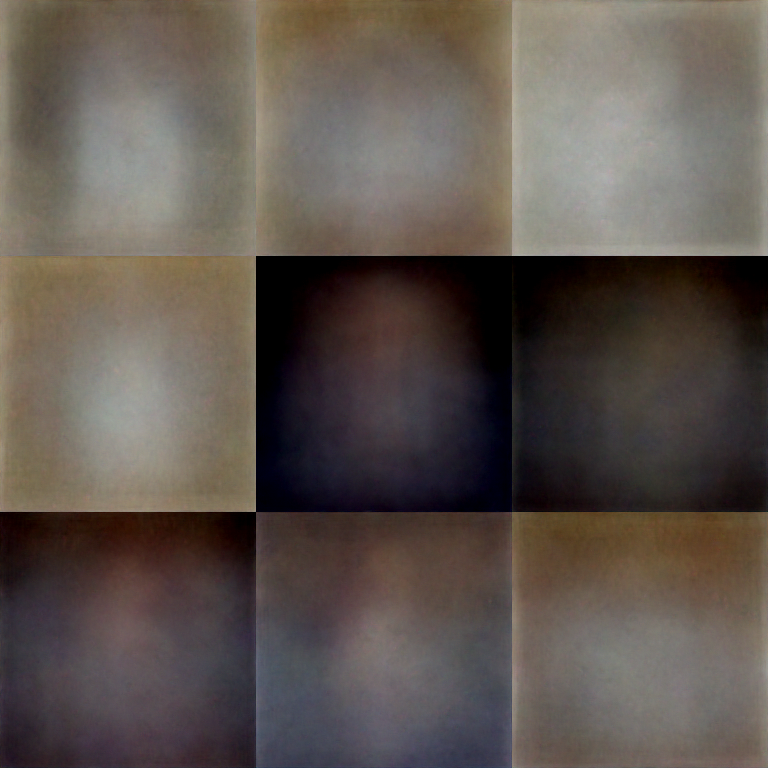


Step 5 of 70:


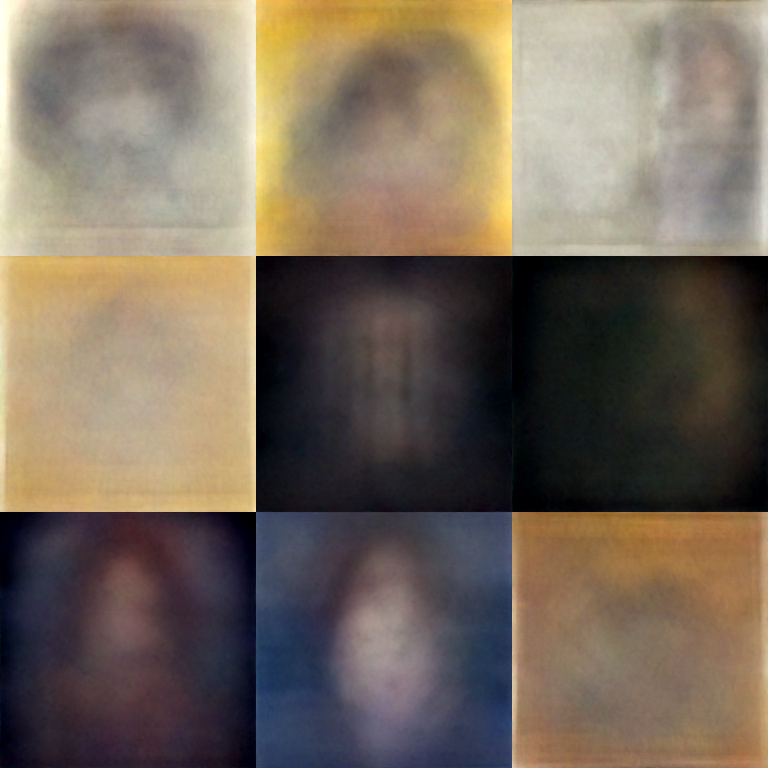


Step 10 of 70:


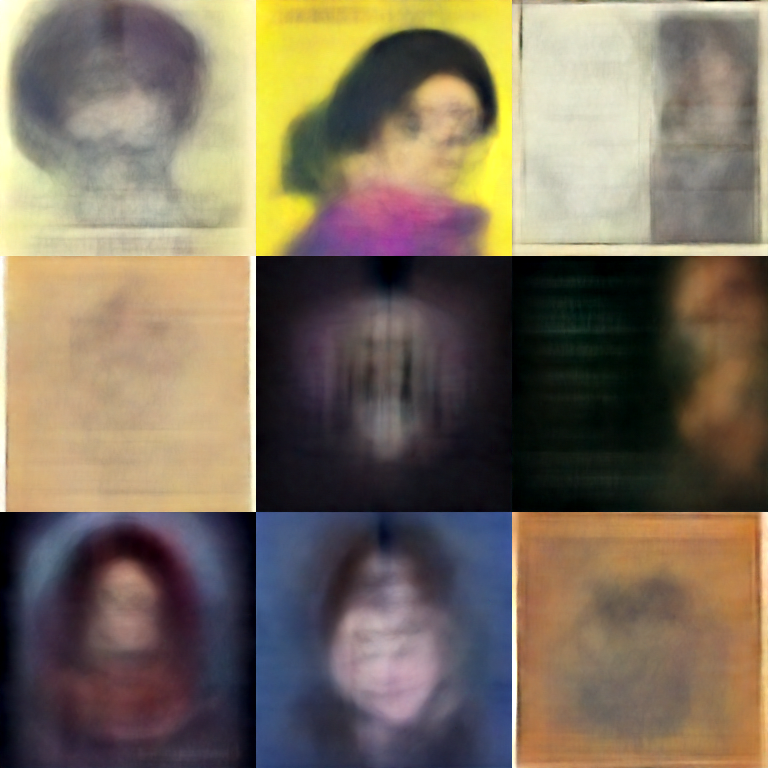


Step 15 of 70:


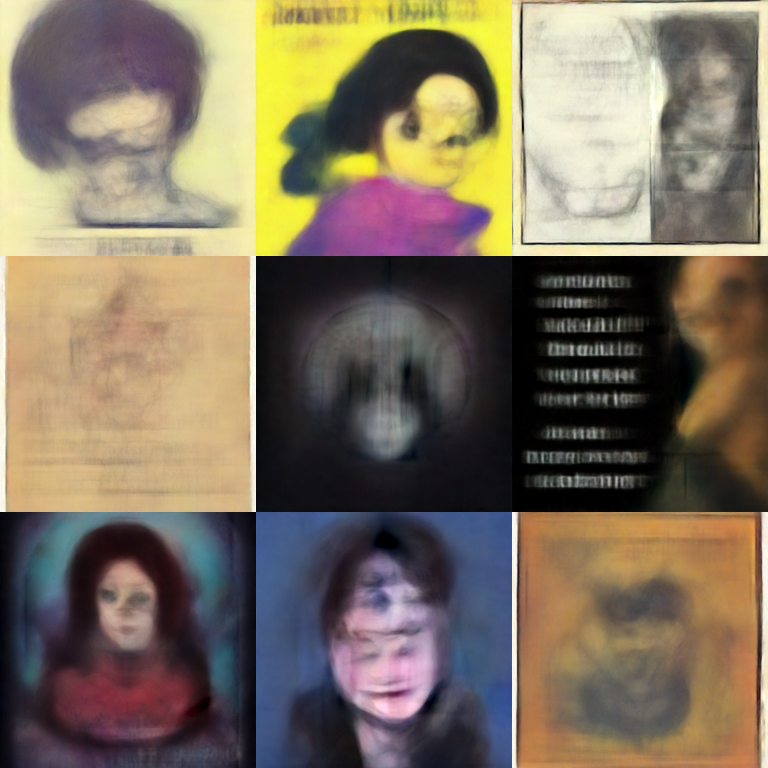


Step 20 of 70:


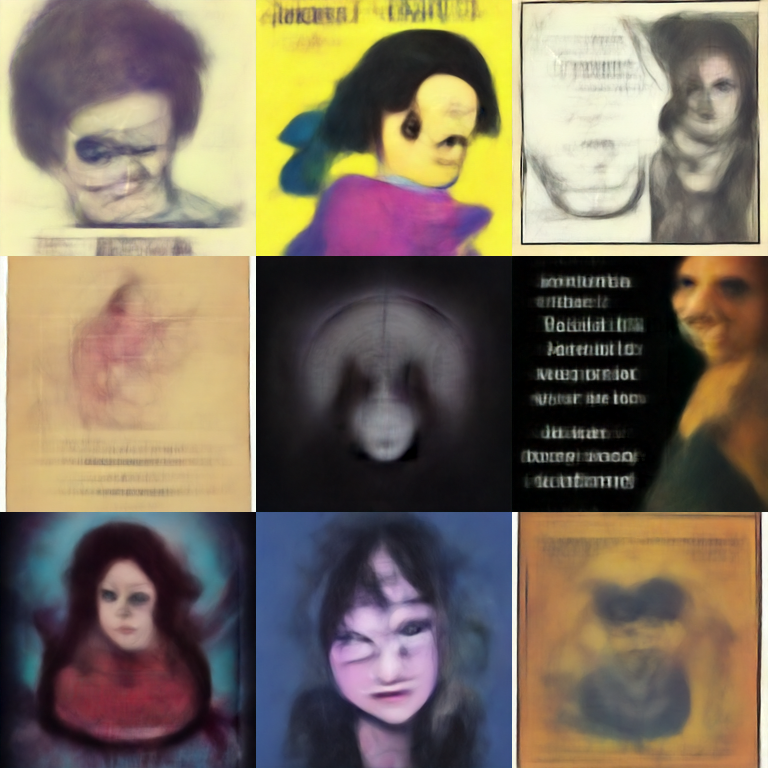


Step 25 of 70:


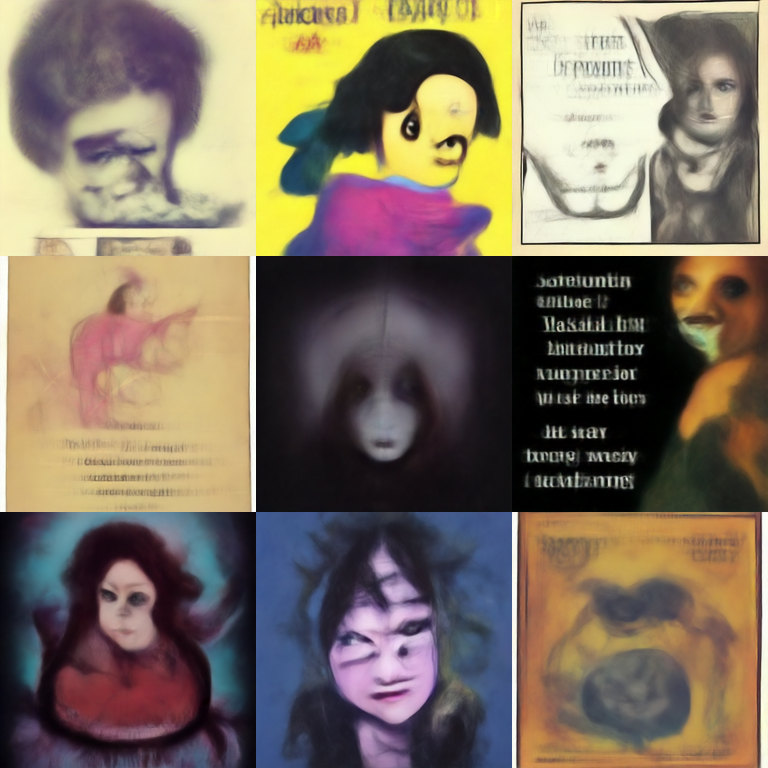


Step 30 of 70:


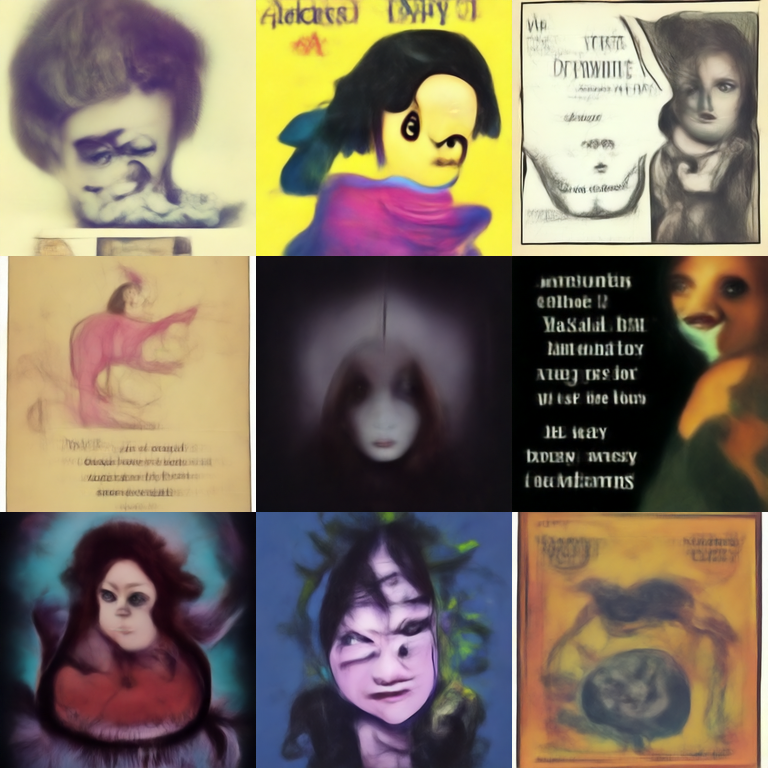


Step 35 of 70:


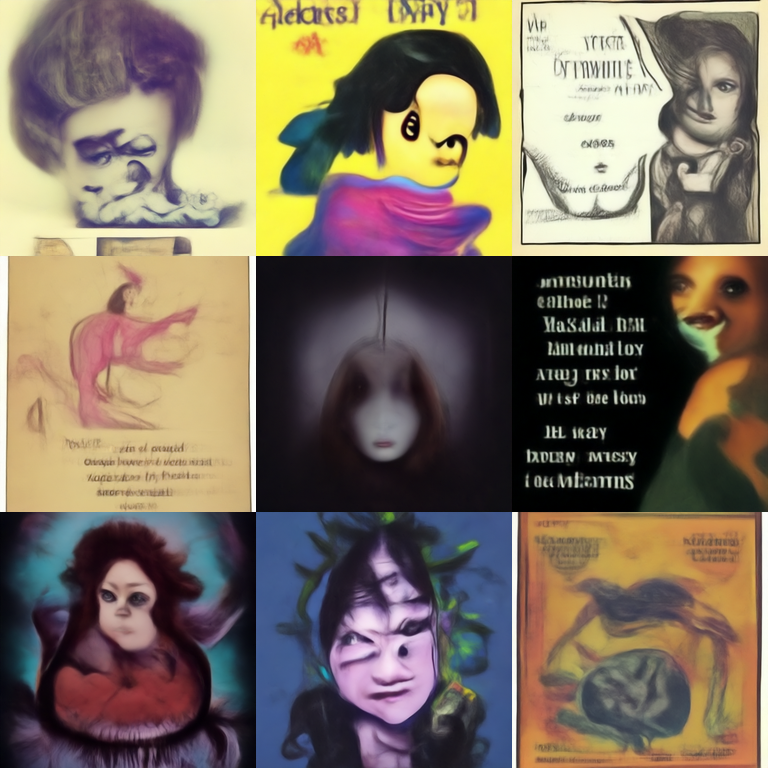


Step 40 of 70:


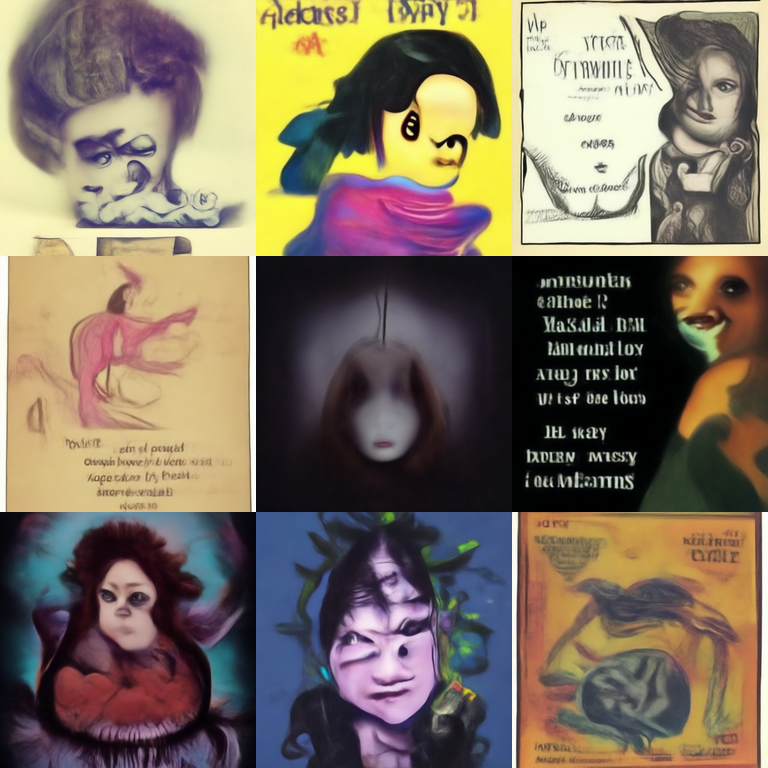


Step 45 of 70:


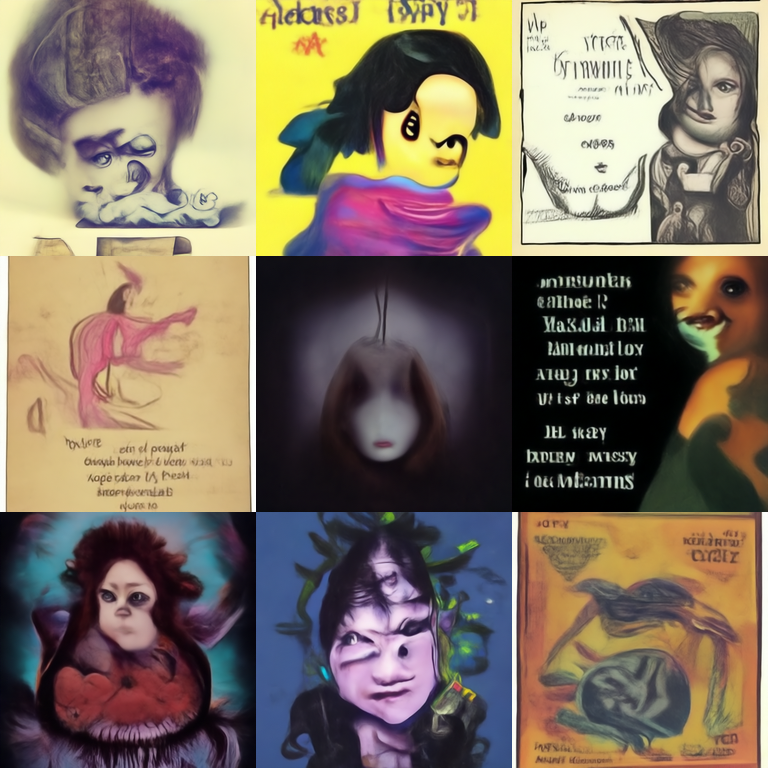


Step 50 of 70:


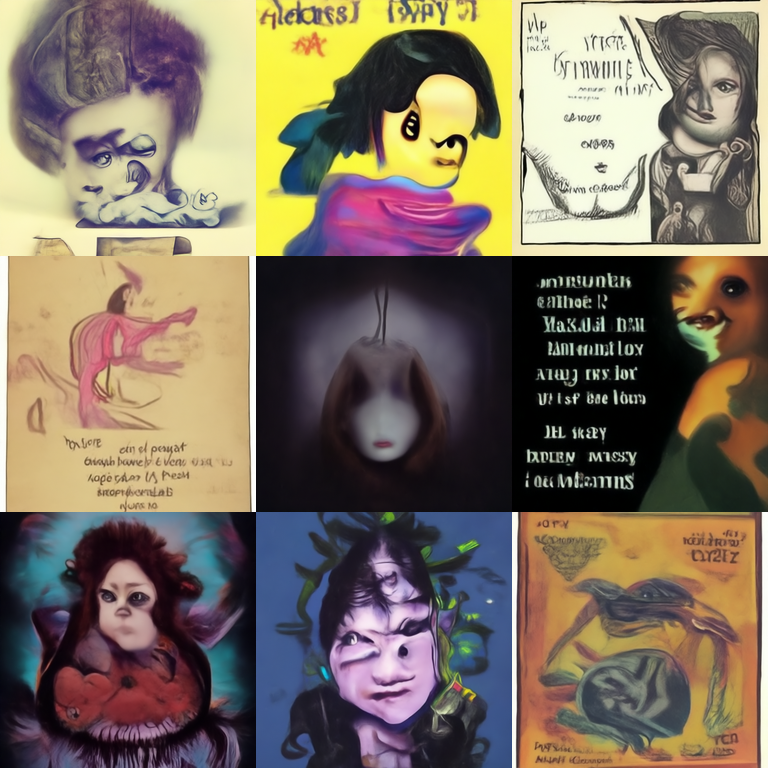


Step 55 of 70:


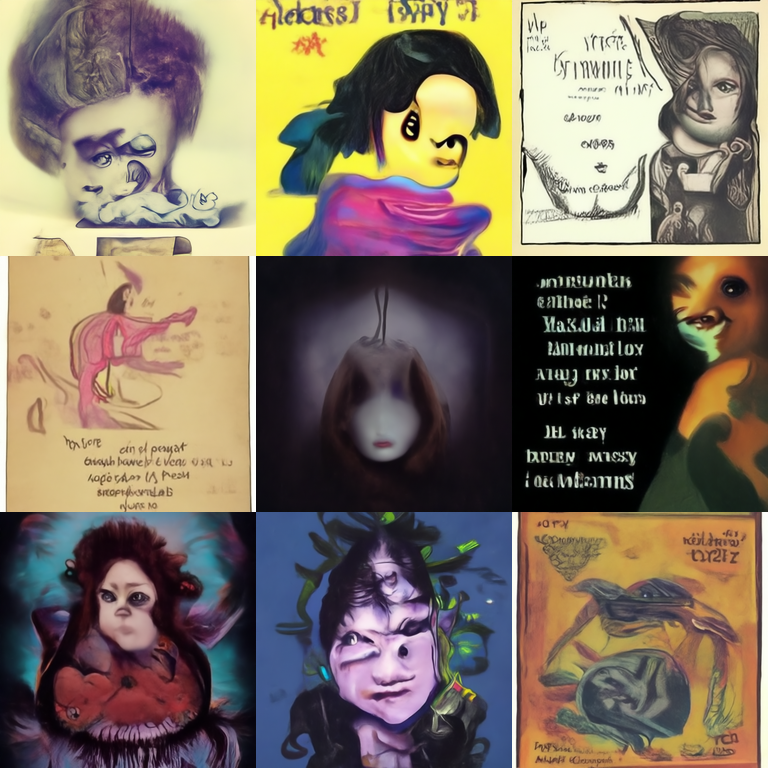


Step 60 of 70:


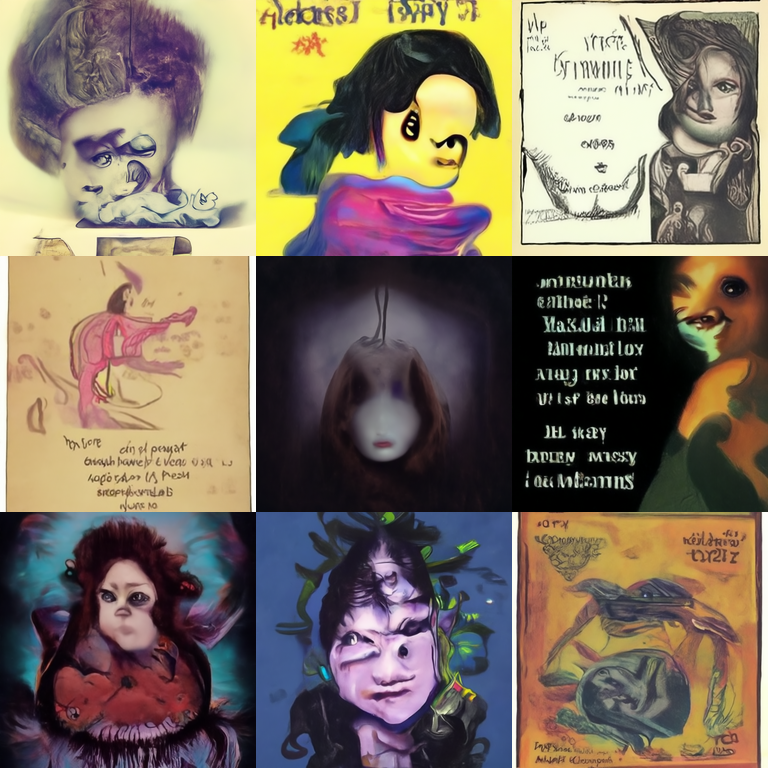


Step 65 of 70:


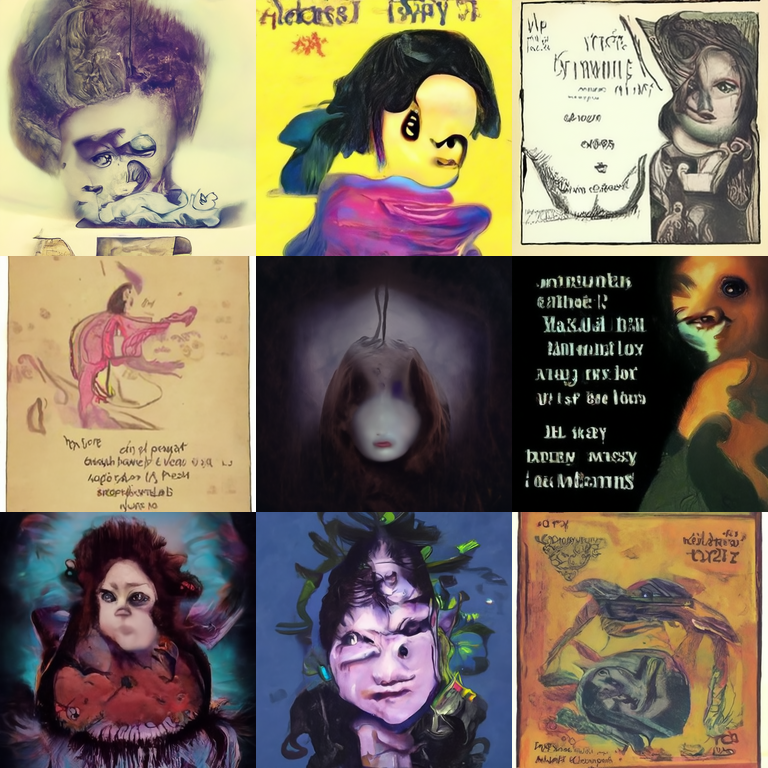


Done!


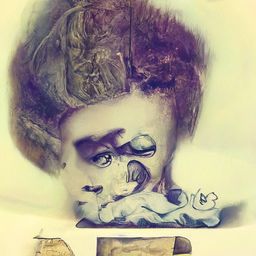

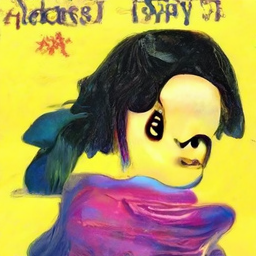

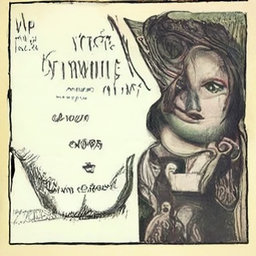

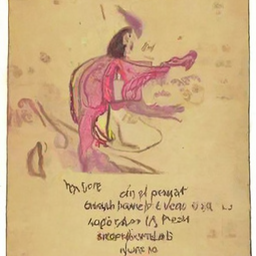

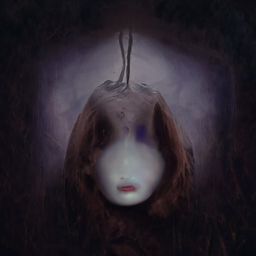

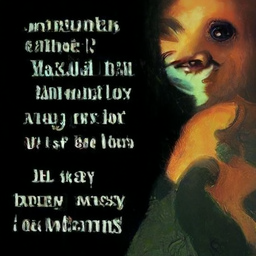

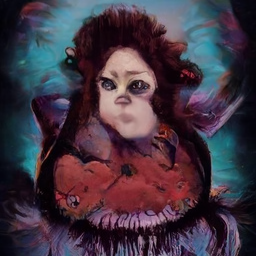

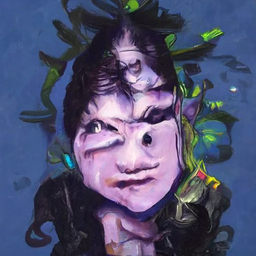

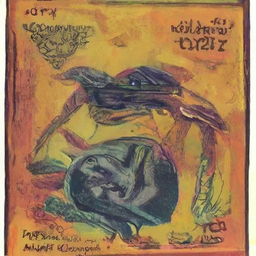

FileNotFoundError: ignored

In [ ]:
#@title Run the Generator
from PIL import ImageFile, Image
import numpy as np
import random
import os
target_embed = clip_model.encode_text(clip.tokenize(input_words)).float().cuda()
from IPython.display import clear_output

def cfg_model_fn(x, t):
    """The CFG wrapper function."""
    n = x.shape[0]
    x_in = x.repeat([2, 1, 1, 1])
    t_in = t.repeat([2])
    clip_embed_repeat = target_embed.repeat([n, 1])
    clip_embed_in = torch.cat([torch.zeros_like(clip_embed_repeat), clip_embed_repeat])
    v_uncond, v_cond = model(x_in, t_in, clip_embed_in).chunk(2, dim=0)
    v = v_uncond + (v_cond - v_uncond) * weight
    return v
save_name = 0.00000000

def display_callback(info):
    global save_name
    save_name += 0.00000001
    nrow = math.ceil(info['pred'].shape[0]**0.5)
    grid = tv_utils.make_grid(info['pred'], nrow, padding=0)
    #utils.to_pil_image(grid).save(f"./steps/%.8f.png" % save_name)
    
    if info['i'] % display_every == 0:
        nrow = math.ceil(info['pred'].shape[0]**0.5)
        grid = tv_utils.make_grid(info['pred'], nrow, padding=0)
        tqdm.write(f'Step {info["i"]} of {steps}:')
        display.display(utils.to_pil_image(grid))
        #utils.to_pil_image(grid).save("./steps/Test.png")
        
        tqdm.write(f'')


def run(seed):
    print("Input is: " + input_words)
    
    if seed == -1:
       seed = random.randint(0, 2**32)
      # print(seed)
    print("Seed is: " + str(seed))
    gc.collect()
    torch.cuda.empty_cache()
    torch.manual_seed(seed)
    x = torch.randn([n_images, 3, side_y, side_x], device='cuda')
    t = torch.linspace(1, 0, steps + 1, device='cuda')[:-1]
    step_list = utils.get_spliced_ddpm_cosine_schedule(t)
    outs = sampling.sample(cfg_model_fn, x, step_list, eta, {}, callback=display_callback)
    tqdm.write('Done!')
    for i, out in enumerate(outs):
        filename = f'out_{i}.png'
        utils.to_pil_image(out).save(filename)
        display.display(display.Image(filename))

seed = -1
run(seed)
frames = []
files = []
init_frame = 1 
last_frame = steps 

directory = 'steps'
    # iterate over files in
    # that directory
for filename in os.listdir(directory):
    f = os.path.join(directory, filename)
        # checking if it is a file
    files.append(f)
for i in range(init_frame,last_frame): #
    # save_name2 += 0.00000001
    # filename = f"steps/{save_name2}.png"
    # print(files[i])
    frames.append(Image.open(files[i]))
frames[-1].save("finalgrid.png")
